In [1]:
import zipfile
with zipfile.ZipFile("Finance.zip", 'r') as zip_ref:
 zip_ref.extractall("finance_data")

In [2]:
import os
import pandas as pd

data_path = r"C:\Users\user\Desktop\Machine Learning Course\loan_folder\finance_data\uploaded to kaggle\\"

accounts = pd.read_csv(data_path + "accounts.csv")
customers = pd.read_csv(data_path + "customers.csv")
transactions = pd.read_csv(data_path + "transactions.csv")
branches = pd.read_csv(data_path + "branches.csv")
loans = pd.read_csv(data_path + "loans.csv")
account_types = pd.read_csv(data_path + "account_types.csv")
transaction_types = pd.read_csv(data_path + "transaction_types.csv")
loan_statuses = pd.read_csv(data_path + "loan_statuses.csv")
addresses = pd.read_csv(data_path + "addresses.csv")
customer_types = pd.read_csv(data_path + "customer_types.csv")

In [3]:
customers.head(5)

,CustomerID,FirstName,LastName,DateOfBirth,AddressID,CustomerTypeID
0,10832,Nyla,Aguirre,1974-02-07 00:00:00.000000,881,1
1,10983,NaN,Battle,1963-02-01 00:00:00.000000,958,2
2,10837,Angelena,Harrington,1964-03-25 00:00:00.000000,86,3
3,10107,Remona,Glass,1965-09-16 00:00:00.000000,595,1
4,10553,King,Becker,1966-02-20 00:00:00.000000,969,3


In [4]:
branches.head()

,BranchID,BranchName,AddressID
0,1,Branch 1,733
1,2,Branch 2,511
2,3,Branch 3,27
3,4,Branch 4,97
4,5,Branch 5,796


In [5]:
accounts.head(5)

,AccountID,CustomerID,AccountTypeID,AccountStatusID,Balance,OpeningDate
0,200094,10123,3,1,48348.54,2018-06-12 00:00:00.000000
1,201108,10077,3,1,35001.41,2019-10-30 00:00:00.000000
2,201453,10321,3,2,57081.03,2020-05-24 00:00:00.000000
3,200581,10871,5,1,63164.33,2021-01-27 00:00:00.000000
4,200003,10765,1,1,58739.64,2018-09-12 00:00:00.000000


In [6]:
transactions.head()

,TransactionID,AccountOriginID,AccountDestinationID,TransactionTypeID,Amount,TransactionDate,BranchID,Description
0,3022681,201164,200868,2,855.17,2023-04-20 02:00:00.000000,41,Transaction 22681
1,3037846,200138,201402,2,806.20,2021-08-10 15:00:00.000000,43,Transaction 37846
2,3045293,201002,201180,1,1229.44,2020-08-16 03:00:00.000000,5,Transaction 45293
3,3017397,201066,201144,4,4441.60,2021-10-10 06:00:00.000000,14,Transaction 17397
4,3016750,200289,201413,3,2526.20,2022-07-28 00:00:00.000000,37,Transaction 16750


In [7]:
accounts.shape

(1667, 6)

In [8]:
# Check duplicates in accounts table
print("Accounts duplicates:", accounts.duplicated().sum())


Accounts duplicates: 16


In [9]:
accounts = accounts.drop_duplicates()

In [10]:
accounts.shape

(1651, 6)

In [11]:
accounts.isnull().sum()

AccountID           0
CustomerID          0
AccountTypeID       0
AccountStatusID     0
Balance             0
OpeningDate        33
dtype: int64

In [12]:
customers.shape

(1111, 6)

In [13]:
customers.duplicated().sum()

np.int64(11)

In [14]:
transactions.shape

(50000, 8)

In [15]:
transactions.duplicated().sum()

np.int64(500)

In [16]:
transactions = transactions.drop_duplicates()

In [17]:
transactions.shape

(49500, 8)

In [18]:
branches.shape

(50, 3)

In [19]:
branches.duplicated().sum()

np.int64(0)

In [20]:
loans.duplicated().sum()

np.int64(3)

In [21]:
loans.shape

(333, 7)

In [22]:
loans = loans.drop_duplicates()

In [23]:
loans.shape

(330, 7)

In [24]:
account_types.duplicated().sum()

np.int64(0)

In [25]:
transaction_types.duplicated().sum()

np.int64(0)

In [26]:
loan_statuses.duplicated().sum()

np.int64(0)

In [27]:
addresses.duplicated().sum()

np.int64(12)

In [28]:
addresses.shape

(1222, 4)

In [29]:
addresses = addresses.drop_duplicates()

In [30]:
addresses.shape

(1210, 4)

In [31]:
customer_types.shape

(3, 2)

In [32]:
customer_types.duplicated().sum()

np.int64(0)

In [33]:
accounts.isnull().sum()

AccountID           0
CustomerID          0
AccountTypeID       0
AccountStatusID     0
Balance             0
OpeningDate        33
dtype: int64

In [34]:
accounts.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1651 entries, 0 to 1666
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   AccountID        1651 non-null   int64  
 1   CustomerID       1651 non-null   int64  
 2   AccountTypeID    1651 non-null   int64  
 3   AccountStatusID  1651 non-null   int64  
 4   Balance          1651 non-null   float64
 5   OpeningDate      1618 non-null   object 
dtypes: float64(1), int64(4), object(1)
memory usage: 90.3+ KB


In [35]:
accounts['OpeningDate'] = pd.to_datetime(accounts['OpeningDate'], errors='coerce')

In [36]:
accounts.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1651 entries, 0 to 1666
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   AccountID        1651 non-null   int64         
 1   CustomerID       1651 non-null   int64         
 2   AccountTypeID    1651 non-null   int64         
 3   AccountStatusID  1651 non-null   int64         
 4   Balance          1651 non-null   float64       
 5   OpeningDate      1618 non-null   datetime64[ns]
dtypes: datetime64[ns](1), float64(1), int64(4)
memory usage: 90.3 KB


In [37]:
median_date = accounts['OpeningDate'].median()
accounts['OpeningDate'] = accounts['OpeningDate'].fillna(median_date)
accounts.isnull().sum()

AccountID          0
CustomerID         0
AccountTypeID      0
AccountStatusID    0
Balance            0
OpeningDate        0
dtype: int64

In [38]:
transactions.info()
transactions.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
Index: 49500 entries, 0 to 49999
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   TransactionID         49500 non-null  int64  
 1   AccountOriginID       49500 non-null  int64  
 2   AccountDestinationID  49500 non-null  int64  
 3   TransactionTypeID     49500 non-null  int64  
 4   Amount                49500 non-null  float64
 5   TransactionDate       48510 non-null  object 
 6   BranchID              49500 non-null  int64  
 7   Description           49500 non-null  object 
dtypes: float64(1), int64(5), object(2)
memory usage: 3.4+ MB


TransactionID             0
AccountOriginID           0
AccountDestinationID      0
TransactionTypeID         0
Amount                    0
TransactionDate         990
BranchID                  0
Description               0
dtype: int64

In [39]:
transactions['TransactionDate'] = pd.to_datetime(transactions['TransactionDate'], errors='coerce')

In [40]:
transactions.isnull().sum()

TransactionID             0
AccountOriginID           0
AccountDestinationID      0
TransactionTypeID         0
Amount                    0
TransactionDate         990
BranchID                  0
Description               0
dtype: int64

In [41]:
transactions.info()

<class 'pandas.core.frame.DataFrame'>
Index: 49500 entries, 0 to 49999
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   TransactionID         49500 non-null  int64         
 1   AccountOriginID       49500 non-null  int64         
 2   AccountDestinationID  49500 non-null  int64         
 3   TransactionTypeID     49500 non-null  int64         
 4   Amount                49500 non-null  float64       
 5   TransactionDate       48510 non-null  datetime64[ns]
 6   BranchID              49500 non-null  int64         
 7   Description           49500 non-null  object        
dtypes: datetime64[ns](1), float64(1), int64(5), object(1)
memory usage: 3.4+ MB


In [42]:
median_transaction_date = transactions['TransactionDate'].median()

In [43]:
transactions['TransactionDate'] = transactions['TransactionDate'].fillna(median_transaction_date)

In [44]:
transactions.isnull().sum()

TransactionID           0
AccountOriginID         0
AccountDestinationID    0
TransactionTypeID       0
Amount                  0
TransactionDate         0
BranchID                0
Description             0
dtype: int64

In [45]:
transactions.shape

(49500, 8)

In [46]:
transactions['Year'] = transactions['TransactionDate'].dt.year
transactions['Month'] = transactions['TransactionDate'].dt.month
transactions['Day'] = transactions['TransactionDate'].dt.day

In [47]:
transactions.shape

(49500, 11)

In [48]:
transactions.info()

<class 'pandas.core.frame.DataFrame'>
Index: 49500 entries, 0 to 49999
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   TransactionID         49500 non-null  int64         
 1   AccountOriginID       49500 non-null  int64         
 2   AccountDestinationID  49500 non-null  int64         
 3   TransactionTypeID     49500 non-null  int64         
 4   Amount                49500 non-null  float64       
 5   TransactionDate       49500 non-null  datetime64[ns]
 6   BranchID              49500 non-null  int64         
 7   Description           49500 non-null  object        
 8   Year                  49500 non-null  int32         
 9   Month                 49500 non-null  int32         
 10  Day                   49500 non-null  int32         
dtypes: datetime64[ns](1), float64(1), int32(3), int64(5), object(1)
memory usage: 4.0+ MB


Quick Exploratory Insights (First Analysis)



In [49]:
#Total money moved
transactions['Amount'].sum()

np.float64(123955500.49000001)

In [50]:
#Average transaction value
transactions['Amount'].mean()

np.float64(2504.1515250505054)

In [51]:
#Largest transaction
transactions['Amount'].max()

4999.59

In [52]:
#Transactions per type
transactions.groupby('TransactionTypeID')['Amount'].sum()

TransactionTypeID
1    37647877.22
2    36742449.81
3    37183395.63
4    12381777.83
Name: Amount, dtype: float64

In [53]:
customers.duplicated().sum()

np.int64(11)

In [54]:
customers = customers.drop_duplicates()

In [55]:
customers.duplicated().sum()

np.int64(0)

In [56]:
accounts.to_csv("accounts_cleaned.csv", index=False)
customers.to_csv("customers_cleaned.csv", index=False)
transactions.to_csv("transactions_cleaned.csv", index=False)
loans.to_csv("loans_cleaned.csv", index=False)
branches.to_csv("branches_cleaned.csv", index=False)

In [57]:
#These allow Python to talk to MySQL.
!pip install mysql-connector-python sqlalchemy pymysql

In [58]:
import pandas as pd
from sqlalchemy import create_engine
import mysql.connector
import glob
import os

# 1. Database Connection Details
USER = "root"      # Just 'root', no @localhost
PASSWORD = "michael" 
HOST = "127.0.0.1"
PORT = "3306"
DB_NAME = "banking_project"

In [59]:
engine = create_engine(
    f"mysql+mysqlconnector://{USER}:{PASSWORD}@{HOST}:{PORT}/{DB_NAME}"
)

print("Connected to MySQL successfully!")

Connected to MySQL successfully!


In [60]:
#Point Python to your dataset folder.
folder_path = r"C:\Users\user\Desktop\loan_folder"

In [61]:
#Get All CSV Files Automatically
csv_files = glob.glob(os.path.join(folder_path, "*.csv"))

print(csv_files)

[]


In [62]:
for file in csv_files:
    
    table_name = os.path.basename(file).replace(".csv", "")
    
    df = pd.read_csv(file)
    
    df.to_sql(
        name=table_name,
        con=engine,
        if_exists="replace",
        index=False
    )
    
    print(f"{table_name} uploaded successfully!")

In [63]:
transactions.describe()

,TransactionID,AccountOriginID,AccountDestinationID,TransactionTypeID,Amount,TransactionDate,BranchID,Year,Month,Day
count,4.950000e+04,49500.000000,49500.000000,49500.000000,49500.000000,49500,49500.000000,49500.000000,49500.000000,49500.000000
mean,3.024750e+06,200823.584929,200819.572586,2.194384,2504.151525,2022-02-01 18:41:52.791841536,25.601899,2021.604626,6.311394,15.854081
min,3.000000e+06,200000.000000,200000.000000,1.000000,1.010000,2020-01-01 00:00:00,1.000000,2020.000000,1.000000,1.000000
25%,3.012375e+06,200412.000000,200408.000000,1.000000,1261.780000,2021-01-17 18:45:00,13.000000,2021.000000,3.000000,8.000000
50%,3.024750e+06,200818.000000,200814.000000,2.000000,2504.885000,2022-01-25 00:00:00,26.000000,2022.000000,6.000000,16.000000
75%,3.037124e+06,201238.000000,201231.000000,3.000000,3754.122500,2023-01-28 07:30:00,38.000000,2023.000000,9.000000,24.000000
max,3.049499e+06,201650.000000,201650.000000,4.000000,4999.590000,2026-08-28 15:01:43.084879,50.000000,2026.000000,12.000000,31.000000
std,1.428956e+04,477.022097,476.273969,0.982664,1442.508008,NaN,14.477187,1.225756,3.554246,8.838976


In [64]:
customers.shape

(1100, 6)

In [65]:
customers.duplicated().sum()

np.int64(0)

In [66]:
transactions.info

<bound method DataFrame.info of        TransactionID  AccountOriginID  AccountDestinationID  \
0            3022681           201164                200868   
1            3037846           200138                201402   
2            3045293           201002                201180   
3            3017397           201066                201144   
4            3016750           200289                201413   
...              ...              ...                   ...   
49994        3028048           200640                201374   
49995        3006284           200709                200667   
49996        3028219           200513                200603   
49998        3009955           200045                200942   
49999        3018946           201361                200162   

       TransactionTypeID   Amount     TransactionDate  BranchID  \
0                      2   855.17 2023-04-20 02:00:00        41   
1                      2   806.20 2021-08-10 15:00:00        43   
2         

In [67]:
import plotly.express as px

# 1. Create the Interactive Histogram
# We add 'marginal="box"' which puts a box plot on top to show outliers automatically!
fig_dist = px.histogram(
    transactions, 
    x="Amount", 
    nbins=100,
    title="Distribution of Transaction Amounts",
    color_discrete_sequence=['teal'],
    marginal="box", # This shows the Min, Max, Median, and Outliers in one view
    hover_data=transactions.columns # Shows all details when you hover
)

# 2. Add a vertical line for the Average (Mean)
# Reasoning: This gives a clear benchmark for what a 'normal' transaction looks like.
mean_val = transactions['Amount'].mean()
fig_dist.add_vline(x=mean_val, line_dash="dash", line_color="red", 
                  annotation_text=f"Average: ${mean_val:.2f}")

# 3. Update layout for a professional look
fig_dist.update_layout(
    xaxis_title="Transaction Amount ($)",
    yaxis_title="Frequency",
    template="plotly_white"
)

fig_dist.show()

In [68]:
# !pip install plotly  # Run this if you don't have it installed
import plotly.express as px

In [69]:
transactions.info()

<class 'pandas.core.frame.DataFrame'>
Index: 49500 entries, 0 to 49999
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   TransactionID         49500 non-null  int64         
 1   AccountOriginID       49500 non-null  int64         
 2   AccountDestinationID  49500 non-null  int64         
 3   TransactionTypeID     49500 non-null  int64         
 4   Amount                49500 non-null  float64       
 5   TransactionDate       49500 non-null  datetime64[ns]
 6   BranchID              49500 non-null  int64         
 7   Description           49500 non-null  object        
 8   Year                  49500 non-null  int32         
 9   Month                 49500 non-null  int32         
 10  Day                   49500 non-null  int32         
dtypes: datetime64[ns](1), float64(1), int32(3), int64(5), object(1)
memory usage: 4.0+ MB


In [70]:
transactions['TransactionDate'] = pd.to_datetime(transactions['TransactionDate'])
transactions['day_of_week'] = transactions['TransactionDate'].dt.day_name()
transactions.info()

<class 'pandas.core.frame.DataFrame'>
Index: 49500 entries, 0 to 49999
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   TransactionID         49500 non-null  int64         
 1   AccountOriginID       49500 non-null  int64         
 2   AccountDestinationID  49500 non-null  int64         
 3   TransactionTypeID     49500 non-null  int64         
 4   Amount                49500 non-null  float64       
 5   TransactionDate       49500 non-null  datetime64[ns]
 6   BranchID              49500 non-null  int64         
 7   Description           49500 non-null  object        
 8   Year                  49500 non-null  int32         
 9   Month                 49500 non-null  int32         
 10  Day                   49500 non-null  int32         
 11  day_of_week           49500 non-null  object        
dtypes: datetime64[ns](1), float64(1), int32(3), int64(5), object(2)
memory usage: 4

In [71]:
# 1. Group the data so Plotly can read it
# We count how many transactions happened on each day
day_counts = transactions['day_of_week'].value_counts().reset_index()
day_counts.columns = ['Day', 'Transaction_Count']

# 2. Create the Interactive Bar Chart
fig = px.bar(
    day_counts, 
    x='Day', 
    y='Transaction_Count',
    title='Transaction Volume by Day',
    category_orders={"Day": ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]},
    color='Transaction_Count',
    color_continuous_scale='Viridis',
    labels={'Transaction_Count': 'Number of Transactions'}
)

# 3. Add 'Hover' customization
fig.update_traces(hovertemplate='<b>%{x}</b><br>Total Transactions: %{y}')

fig.show()

In [72]:
import plotly.express as px

# 1. Grouping and Aggregating
# Reasoning: We sum the 'Amount' for each 'AccountOriginID' to see the total value moved.
top_accounts = transactions.groupby('AccountOriginID')['Amount'].sum().reset_index()

# 2. Sorting and Filtering
# Reasoning: We sort descending and take the top 10 to focus on the highest contributors.
top_accounts = top_accounts.sort_values(by='Amount', ascending=False).head(10)

# Convert AccountID to string for the plot
# Reasoning: IDs are numbers, but we want the chart to treat them as distinct labels (categories).
top_accounts['AccountOriginID'] = top_accounts['AccountOriginID'].astype(str)

# 3. Create the Interactive Plot
fig_top_accounts = px.bar(
    top_accounts, 
    x='AccountOriginID', 
    y='Amount',
    title='Top 10 Accounts by Total Transaction Value',
    labels={'Amount': 'Total Value ($)', 'AccountOriginID': 'Account ID'},
    color='Amount',
    color_continuous_scale='Blues',
    text_auto='.2s' # Automatically adds formatted value labels on top of bars
)

# Customize the look
fig_top_accounts.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)
fig_top_accounts.update_layout(xaxis_tickangle=-45, template="plotly_white")

fig_top_accounts.show()

In [73]:
loans.info()

<class 'pandas.core.frame.DataFrame'>
Index: 330 entries, 0 to 332
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   LoanID            330 non-null    int64  
 1   AccountID         330 non-null    int64  
 2   LoanStatusID      330 non-null    int64  
 3   PrincipalAmount   330 non-null    float64
 4   InterestRate      330 non-null    float64
 5   StartDate         324 non-null    object 
 6   EstimatedEndDate  324 non-null    object 
dtypes: float64(2), int64(3), object(2)
memory usage: 20.6+ KB


In [74]:
# 1. Convert objects to datetime
loans['StartDate'] = pd.to_datetime(loans['StartDate'], errors='coerce')
loans['EstimatedEndDate'] = pd.to_datetime(loans['EstimatedEndDate'], errors='coerce')

# 2. Handle missing dates
# We can drop them or fill them. For a bank, a loan without a date is an error.
# Let's drop them to keep the data clean for this project.
loans = loans.dropna(subset=['StartDate'])

print("Cleaning Complete: Dates converted and missing rows handled.")

Cleaning Complete: Dates converted and missing rows handled.


In [75]:
# 1. Create a safe copy
loans = loans.copy()

# 2. Convert column type so it can hold text values
loans['EstimatedEndDate'] = loans['EstimatedEndDate'].astype('object')

# 3. Replace null values
loans.loc[loans['EstimatedEndDate'].isnull(), 'EstimatedEndDate'] = 'Ongoing'


In [76]:
branches.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50 entries, 0 to 49
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   BranchID    50 non-null     int64 
 1   BranchName  50 non-null     object
 2   AddressID   50 non-null     int64 
dtypes: int64(2), object(1)
memory usage: 1.3+ KB


In [77]:
# 1. Link Transactions to Accounts to find the Customer associated with the activity
trans_acc_merge = pd.merge(transactions, accounts, left_on='AccountOriginID', right_on='AccountID')

# 2. Link that to Branches to get the actual names
branch_activity = pd.merge(trans_acc_merge, branches, on='BranchID')

# 3. Count UNIQUE customers per branch
# Reasoning: One customer might have 50 transactions, but we only want to count them once.
cust_per_branch = branch_activity.groupby('BranchName')['CustomerID'].nunique().reset_index()
cust_per_branch.columns = ['BranchName', 'Unique_Customers']

# 4. Plot the results
import plotly.express as px

fig_branch = px.bar(
    cust_per_branch.sort_values(by='Unique_Customers', ascending=False), 
    x='BranchName', 
    y='Unique_Customers',
    title='Unique Customer Traffic by Branch Location',
    color='Unique_Customers',
    text_auto=True,
    color_continuous_scale='Tealgrn'
)

fig_branch.show()

In [78]:
loans.info()

<class 'pandas.core.frame.DataFrame'>
Index: 324 entries, 0 to 332
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   LoanID            324 non-null    int64         
 1   AccountID         324 non-null    int64         
 2   LoanStatusID      324 non-null    int64         
 3   PrincipalAmount   324 non-null    float64       
 4   InterestRate      324 non-null    float64       
 5   StartDate         324 non-null    datetime64[ns]
 6   EstimatedEndDate  324 non-null    object        
dtypes: datetime64[ns](1), float64(2), int64(3), object(1)
memory usage: 20.2+ KB


In [79]:
import plotly.express as px

# Using 'PrincipalAmount' from your info() output
fig_loan_dist = px.histogram(
    loans, 
    x="PrincipalAmount", 
    nbins=40,
    title="Loan Principal Amount Distribution",
    marginal="box", 
    color_discrete_sequence=['#00CC96'], # A 'banking green' for growth
    opacity=0.8
)

fig_loan_dist.update_layout(
    xaxis_title="Principal Amount ($)",
    yaxis_title="Number of Loans",
    template="plotly_white"
)

fig_loan_dist.show()

In [80]:
# 1. Count occurrences of each status
status_summary = loans['LoanStatusID'].value_counts().reset_index()
status_summary.columns = ['LoanStatusID', 'Count']

# 2. Map IDs to names (if you haven't joined the status table yet)
# Common mapping: 1=Active, 2=Paid, 3=Defaulted
status_map = {1: 'Active', 2: 'Paid', 3: 'Defaulted'}
status_summary['Status_Name'] = status_summary['LoanStatusID'].map(status_map)

fig_pie = px.pie(
    status_summary, 
    values='Count', 
    names='Status_Name', 
    title='Overall Loan Portfolio Health',
    hole=0.5,
    color_discrete_map={'Active':'#636EFA', 'Paid':'#00CC96', 'Defaulted':'#EF553B'}
)

fig_pie.show()

In [81]:
loans.shape

(324, 7)

In [82]:
# 1. Identify which ID represents Default (usually 3)
DEFAULT_VAL = 3 

# 2. Logic: (Number of Defaulted Loans / Total Loans) * 100
total_count = len(loans)
default_count = len(loans[loans['LoanStatusID'] == DEFAULT_VAL])

default_rate = (default_count / total_count) * 100

print(f"--- Portfolio Risk Metrics ---")
print(f"Total Loan Records: {total_count}")
print(f"Defaulted Records:  {default_count}")
print(f"Current Default Rate: {default_rate:.2f}%")

--- Portfolio Risk Metrics ---
Total Loan Records: 324
Defaulted Records:  34
Current Default Rate: 10.49%


In [83]:
# 1. Fill missing names
customers['FirstName'] = customers['FirstName'].fillna('Unknown')
customers['LastName'] = customers['LastName'].fillna('Customer')

# 2. Create FullName for your charts
customers['FullName'] = customers['FirstName'] + " " + customers['LastName']

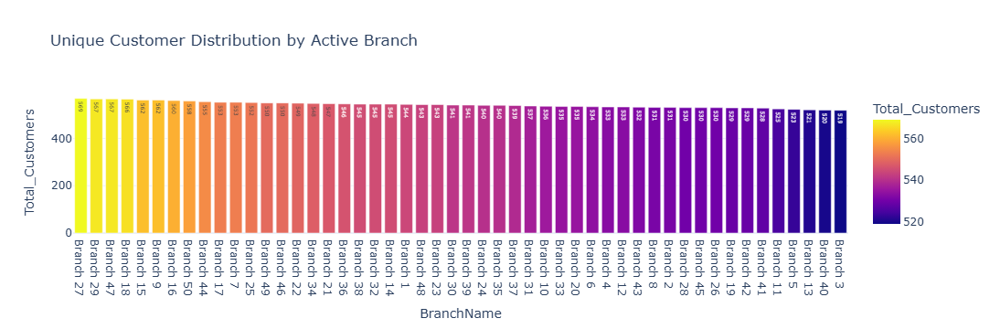

In [84]:
import plotly.express as px

# 1. Merge Customers -> Accounts -> Transactions
cust_activity = customers.merge(accounts, on='CustomerID').merge(transactions, left_on='AccountID', right_on='AccountOriginID')

# 2. Merge with Branches to get the names
branch_cust_data = cust_activity.merge(branches, on='BranchID')

# 3. Count UNIQUE customers per branch
# Use nunique() because one customer might have many transactions at the same branch
branch_counts = branch_cust_data.groupby('BranchName')['CustomerID'].nunique().reset_index()
branch_counts.columns = ['BranchName', 'Total_Customers']

# 4. Visualize
fig_branch = px.bar(
    branch_counts.sort_values(by='Total_Customers', ascending=False),
    x='BranchName',
    y='Total_Customers',
    title='Unique Customer Distribution by Active Branch',
    color='Total_Customers',
    text_auto=True,
    template='plotly_white'
)
fig_branch.show()

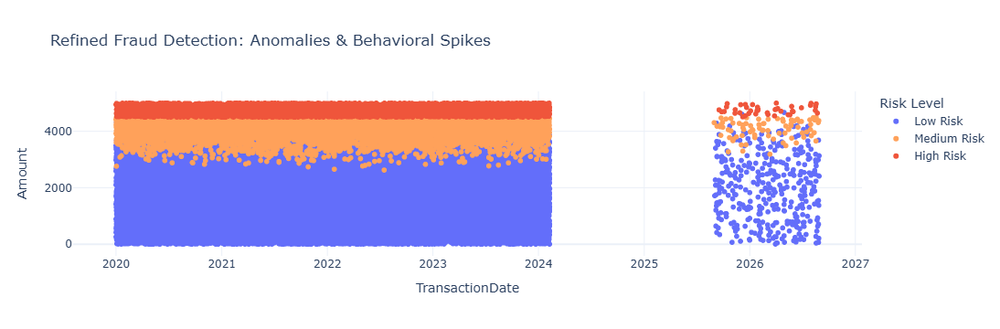

Fraud Detection Summary:
fraud_flag
Low Risk       37740
Medium Risk     6884
High Risk       4876
Name: count, dtype: int64


In [85]:

import numpy as np
# --- 1. Statistical Outlier Detection (IQR Method) ---
# We use a 1.1x multiplier here to ensure we catch the top tier of your $0-$5k distribution
Q1 = transactions['Amount'].quantile(0.25)
Q3 = transactions['Amount'].quantile(0.75)
IQR = Q3 - Q1
upper_bound = Q3 + (1.1 * IQR) 

# --- 2. Behavioral Spike Detection ---
# Calculate the average transaction for EACH account to find personal spikes
transactions['Account_Mean'] = transactions.groupby('AccountOriginID')['Amount'].transform('mean')
transactions['is_spike'] = transactions['Amount'] > (transactions['Account_Mean'] * 1.5)

# --- 3. Business Logic Threshold ---
# Flag anything near the ceiling of your dataset
BUSINESS_LIMIT = 4500

# --- 4. The Fraud Pipeline Logic ---
# High Risk: High Amount AND a personal spike
# Medium Risk: Either a high amount OR a statistical outlier
conditions = [
    (transactions['Amount'] >= BUSINESS_LIMIT) & (transactions['is_spike'] == True),
    (transactions['Amount'] >= upper_bound) | (transactions['is_spike'] == True)
]
choices = ['High Risk', 'Medium Risk']

transactions['fraud_flag'] = np.select(conditions, choices, default='Low Risk')

# --- 5. Final Visualization ---
fig_fraud = px.scatter(
    transactions, 
    x='TransactionDate', 
    y='Amount', 
    color='fraud_flag',
    title='Refined Fraud Detection: Anomalies & Behavioral Spikes',
    hover_data=['AccountOriginID', 'Description'],
    color_discrete_map={'High Risk': '#EF553B', 'Medium Risk': '#FFA15A', 'Low Risk': '#636EFA'},
    template='plotly_white'
)

fig_fraud.update_layout(legend_title_text='Risk Level')
fig_fraud.show()

# Print summary to verify
print("Fraud Detection Summary:")
print(transactions['fraud_flag'].value_counts())

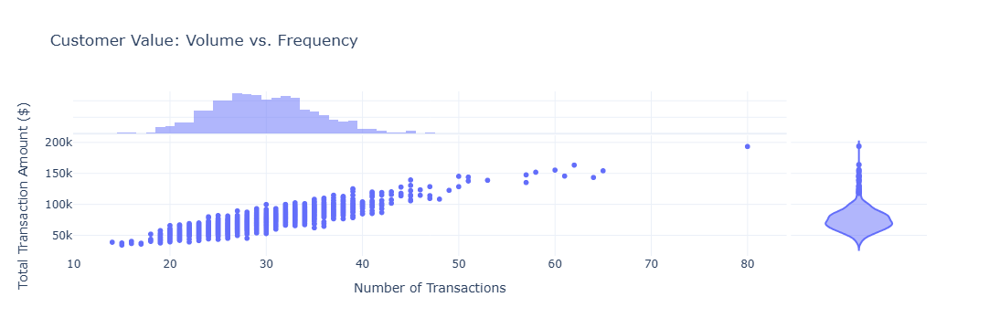

In [87]:
import plotly.express as px

# 1. Calculate the metrics (same as before)
customer_stats = transactions.groupby('AccountOriginID').agg({
    'Amount': 'sum', 
    'TransactionID': 'count'
}).reset_index()

# 2. Create the interactive scatter plot
fig = px.scatter(
    customer_stats, 
    x='TransactionID', 
    y='Amount',
    hover_name='AccountOriginID',  # Shows the ID when you hover
    title="Customer Value: Volume vs. Frequency",
    labels={
        "TransactionID": "Number of Transactions",
        "Amount": "Total Transaction Amount ($)"
    },
    template="plotly_white",
    marginal_x="histogram",  # Adds a distribution view on top
    marginal_y="violin"      # Adds a distribution view on the side
)

# 3. Show the plot
fig.show()